In [2]:
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np
from scipy.fftpack import fft, irfft
from scipy.signal import detrend
import pywt

In [3]:
# Conducting exploratory analysis on engine data
df = pd.read_csv("./CMaps/train_FD001.txt", delimiter=' ')

In [4]:
# Opening of data reveals that there is no data labels so I am naming them here
column_names = ["unit_number","cycle_number","operational_setting_1","operational_setting_2","operational_setting_3"]

print("Number of columns in data:", len(df.columns))

# The rest of the columns are sensor measurements, let's label the remaining by an index 
for k in range(1,len(df.columns)-len(column_names)+1):
    column_names.append("sensor_measurement_{}".format(k))

df.columns = column_names

Number of columns in data: 28


In [5]:
# Exploring the renamed data
df.head()

,unit_number,cycle_number,operational_setting_1,operational_setting_2,operational_setting_3,sensor_measurement_1,sensor_measurement_2,sensor_measurement_3,sensor_measurement_4,sensor_measurement_5,...,sensor_measurement_14,sensor_measurement_15,sensor_measurement_16,sensor_measurement_17,sensor_measurement_18,sensor_measurement_19,sensor_measurement_20,sensor_measurement_21,sensor_measurement_22,sensor_measurement_23
0,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236,NaN,NaN
1,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442,NaN,NaN
2,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739,NaN,NaN
3,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044,NaN,NaN
4,1,6,-0.0043,-0.0001,100.0,518.67,642.10,1584.47,1398.37,14.62,...,8132.85,8.4108,0.03,391,2388,100.0,38.98,23.3669,NaN,NaN


# Removing unnecessary features

From the exploratory analysis, it looks like sensors 1, 5, 10, 16, 19, 22 and 23 do not change in time, so they probably wont be useful in predicint the remaining usefuil life. to cut down on the number of feauters to plot, lets remove them

In [6]:
df.drop(["operational_setting_3",
            "sensor_measurement_1", 
              "sensor_measurement_5", 
              "sensor_measurement_10", 
              "sensor_measurement_16",
              "sensor_measurement_18",
              "sensor_measurement_19", 
              "sensor_measurement_22",
              "sensor_measurement_23"], axis=1, inplace=True)

In [7]:
# Let's make sure that I am selecting the correct data, I want the longest/shorted lived units
# Determined by exploratory_analysis_engine_data.ipynb
long_short_living_units = df[(df["unit_number"]==69) | (df["unit_number"]==39) ]

print("Units in this dataset: {}".format( long_short_living_units["unit_number"].unique()))
long_short_living_units.head()

Units in this dataset: [39 69]


,unit_number,cycle_number,operational_setting_1,operational_setting_2,sensor_measurement_2,sensor_measurement_3,sensor_measurement_4,sensor_measurement_6,sensor_measurement_7,sensor_measurement_8,sensor_measurement_9,sensor_measurement_11,sensor_measurement_12,sensor_measurement_13,sensor_measurement_14,sensor_measurement_15,sensor_measurement_17,sensor_measurement_20,sensor_measurement_21
7509,39,1,-0.0004,-0.0002,642.72,1592.37,1410.00,21.61,552.82,2388.12,9043.49,47.64,521.78,2388.10,8133.27,8.4451,392,38.90,23.2947
7510,39,2,-0.0062,0.0002,642.61,1586.25,1407.99,21.61,553.25,2388.10,9049.07,47.60,521.56,2388.10,8126.00,8.4279,395,38.82,23.4604
7511,39,3,0.0007,-0.0000,642.26,1586.25,1407.48,21.61,552.90,2388.13,9040.05,47.56,522.15,2388.07,8123.32,8.4143,394,38.73,23.2669
7512,39,4,-0.0039,0.0005,642.46,1587.90,1405.23,21.61,553.55,2388.12,9053.54,47.40,521.83,2388.13,8123.19,8.4599,394,38.82,23.3789
7513,39,5,0.0039,0.0002,642.31,1587.08,1408.78,21.61,553.40,2388.10,9044.92,47.50,521.76,2388.07,8125.88,8.4607,394,38.73,23.3338


In [8]:
# What are the number of cycles that these units survived?
longest_cycles = long_short_living_units[long_short_living_units["unit_number"]==69]["cycle_number"].max()
shortest_cycles = long_short_living_units[long_short_living_units["unit_number"]==39]["cycle_number"].max()
print("Max cycles: {} unit 39 ".format(shortest_cycles))
print("Max cycles: {} unit 69".format(longest_cycles))

Max cycles: 128 unit 39 
Max cycles: 362 unit 69


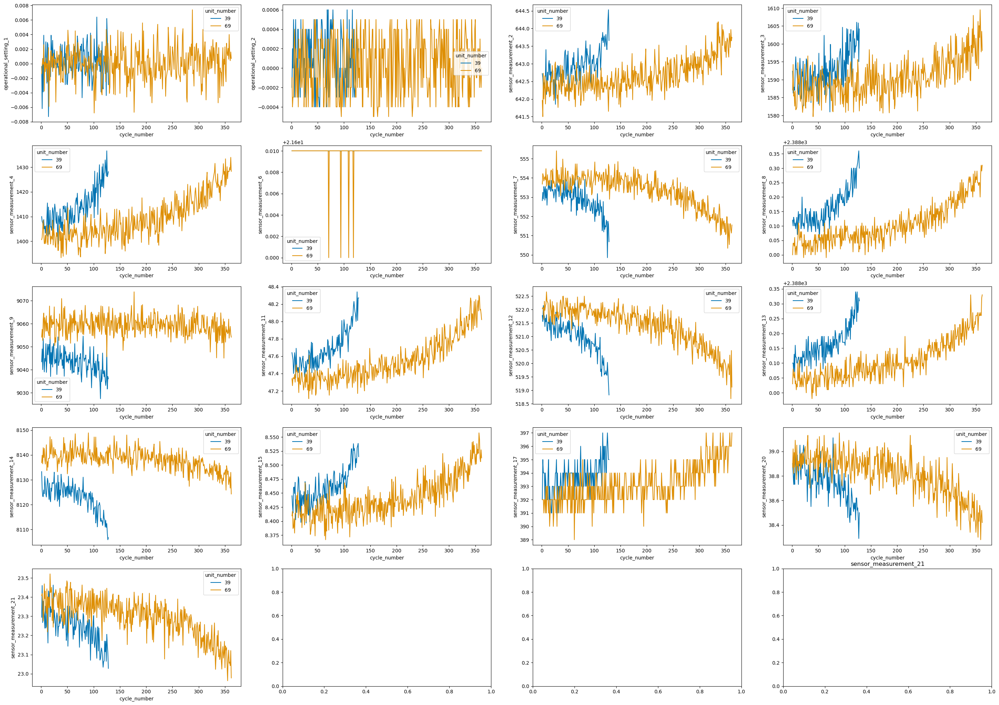

In [10]:
# Let's take a look at the sensor data for units 69 and 39 which are the longest and shortest living units

# There are 26 sensors, 24 with meaningful data so let's make a 5 by 5 grid, the last 2 are NAN plots anyway
fig, axes = plt.subplots(5, 4, figsize=(35, 25))
# fig.suptitle("Longest vs Shortest living engine")
for var, ax in zip(list(df.columns)[2:], axes.flat):
    # print(var)
    sns.lineplot(data = long_short_living_units , x = "cycle_number", y = var, hue=long_short_living_units["unit_number"], 
                 palette="colorblind",
                 ax=ax
                )
    plt.title(var)

# Ok so, I guess it makes sense that the sensor data is VERY different between the two

# Defining Fourier transform based filters: High, Low and Magnitude based

In [11]:
# Taken from TagUp Data science page
# Let's try to use the frequency filter approach on the TagUp data science page
from scipy.signal import butter, lfilter
def lowpass_filter(signal, cutoff, fs, order=2):
    """
    Remove harmonic components above the cutoff frequency.

    Arguments:
        signal: the input signal as a 1-D array.
        cutoff: the filter cutoff frequency.
        fs: the sampling frequency of the input signal.
        order: order of the filter.
    """
    nyquist = fs / 2
    normal_cutoff = cutoff / nyquist
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return lfilter(b, a, signal)


In [12]:
def highpass_filter(signal, cutoff, fs, order=2):
    """
    Description:
    ---------------
    Removing components of the foutier series based on values ABOVE the specified threshold 

    Arguments:
    ---------------
        signal: the input signal as a 1-D array.
        cutoff: the filter cutoff frequency.
        fs: the sampling frequency of the input signal.
        order: order of the filter.
    """
    nyquist = fs / 2
    normal_cutoff = cutoff / nyquist
    b, a = butter(order, normal_cutoff, btype='high', analog=False)
    return lfilter(b, a, signal)

In [13]:
def magnitude_filter(unfiltered_signal, percent_threshold=0.1):
    '''
    Description:
    --------------
    A function that applies a selection to the signal based on a magnitude threshold
    Only the largest contributing frequency is kept, as well as frequencies that are  percent_threshold*max(unfiltered_signal)

    Arguments:
    ------------
    unfiltered_signal: The original signal that has not been processed, besides maybe detrending
    percent_threshold: The threshold for the magnitude
    '''
    # Extracting the frequency magnitudes from the signal array
    magnitude = np.abs(unfiltered_signal)

    # Remove frequencies with magnitudes lower percent_threshold of max magnitude, only keep the highest contributing to signal
    threshold = percent_threshold * np.max(magnitude)

    # Clone the signal to not adjust the array in place, unfiltered_signal is needed for plotting later
    signal_clone = unfiltered_signal.copy()

    # Set any frequencies lower than the threshold to zero, removing them from the reconstructed 
    signal_clone[magnitude < threshold] = 0
    
    # Reconstruct signal using inverse Fourier transform and keep real part
    filtered_signal = irfft(signal_clone) 
    
    return filtered_signal


In [14]:
def denoise_engine_signal_one_var(engine_nums, dataframe, variable, start_stop_index=[0,0], denoising_method="fourier_lowpass", verbose=False):
    '''
    Description:
    ---------------
    A function that takes in a series of engines, and makes plots of
    1. The original signal measurement as seen in the data,
    2. A plot of the signal distribution that has the data shift/trend removed (necessary for denoising)
    3. A spectral decomposition of the signal after it is stabilized to reveal the largest contributing frequencies
    4. A plot of the signal distribution once it has been denoised, and only contains the largest contributing frequencies

    Inputs:
    -------
    engine_nums: The set of engine signal plots you want to denoise and overlay, should be passed as a string "39,69"
    dataframe: The pandas data frame that contains the engine sensor data
    variable: The sensor signal distributions you wish to plot, "signal_measurement_1", etc.
    start_stop_index: An array that specifies the start and stop index of the slice that you wish to denoise and plot
    
    '''

    # There are 26 sensors, 24 with meaningful data so let's make a 1 by 4 grid to show all of the planned plots
    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    fig.suptitle("Engine No. {}".format(engine_nums))

    # Will attempt to denoise the signal plots using a Fourier decomposition (Inspired by the TagUp submission)
    fs = 200 # 100 Hertz, taken as a trial frequency decomp
    nyq_f = fs / 2  # Nyquist frequency [Hz]

    # Processing the input string specifying the engines , whose characteristics we will plot.
    engine_nums = [int(a) for a in engine_nums.split(",")]

    # Defining the available options for the filters
    denoising_methods = ['fourier_lowpass', 'fourier_highpass', 'fourier_magnitude', 'wavelet']

    if verbose:
        print("Denoising method chosen: {}".format(denoising_method))

    # Throwing an error if the denoising method is not. in the list
    if denoising_method not in denoising_methods:
        raise ValueError(f"Invalid option: '{option}'. Must be one of {denoising_methods}")
    
    
    # Loop over the engines 
    for engine_num in engine_nums:

        # Gather the signal distribution of the ending and variable of interest
        signal = dataframe[dataframe["unit_number"]==engine_num][variable].values

        
        if start_stop_index != [0,0]:
            signal = signal[start_stop_index[0]:start_stop_index[1]]

        
        # Removing the signal shift by subtracting a linear fit of the trend
        detrended_signal = detrend(signal, type="linear")
    
        # Processing the signal using a fourier based method, if specified
        if "fourier" in denoising_method:
            # Taking the magnitude of the components and scaling by frequency
            fft_signal = np.abs(fft(detrended_signal, fs)) / fs
        
            # Extracting positive and negative components
            dc_component = fft_signal[0]
            positive_spectrum = fft_signal[1:int(nyq_f)]
            negative_spectrum = fft_signal[int(nyq_f) + 1:]
            
            # Summing the amplitudes of the frequencies, creating a frequency decomp. plot
            spectrum = np.hstack((negative_spectrum, dc_component, positive_spectrum))
        
            
            # Creating the frequency axis
            frequencies = np.arange(0, len(spectrum)) - len(spectrum) // 2 + 1
        
            
            
            # Apply selection to frequency, and reconstruct
            cutoff = 2
            if denoising_method=="fourier_lowpass":
                # Applying a filter based on magnitude, not signal spectrum, similar to Tagup Method
                denoised_signal = irfft(lowpass_filter(detrended_signal, cutoff, fs, order=4))
            elif denoising_method=="fourier_highpass":
                # Applying a filter based on magnitude, not signal spectrum
                denoised_signal = irfft(highpass_filter(detrended_signal, cutoff, fs, order=4))
            elif denoising_method=="fourier_magnitude":
    
                # Applying a filter based on magnitude, not signal spectrum
                denoised_signal = magnitude_filter(detrended_signal, percent_threshold=.99)

            
            axes[2].set_title("Frequency spectrum of \n" + variable[variable.find("_")+1:])
            axes[2].set_xlabel("Frequency [Hz]")
            axes[2].set_ylabel("Amplitude")
            axes[2].plot(frequencies,spectrum)


        
        # Processing the signal using a wavelet based method, if specified
        elif denoising_method=="wavelet":
            
            wavelet = "db4"  # Daubechies wavelet, commonly used for denoising
            level = 3        # Decomposition level
            
            # Perform Discrete Wavelet Transform (DWT)
            coeffs = pywt.wavedec(detrended_signal, wavelet, level=level)
            
            # Apply soft thresholding to detail coefficients
            threshold = np.std(coeffs[-1])  # Adaptive threshold based on noise level
            coeffs_denoised = [coeffs[0]] + [pywt.threshold(c, threshold, mode="soft") for c in coeffs[1:]]
            
            # Reconstruct the denoised signal
            denoised_signal = pywt.waverec(coeffs_denoised, wavelet)
    




    
        # Setting plot labels and plotting
        axes[0].set_title("Original \n" + variable[variable.find("_")+1:])
        axes[0].set_xlabel("Cycle Number")
        axes[0].set_ylabel("Measurement")
        axes[0].plot(signal)
    
        axes[1].set_title("Detrended \n" + variable[variable.find("_")+1:])
        axes[1].set_xlabel("Cycle Number")
        axes[1].set_ylabel("Shifted Measurement")
        axes[1].plot(detrended_signal)
    
        # Freqeuncy decomposition plot shown in axis 2, only created when using fourier method
    
        axes[3].set_title("Denoised \n" + variable[variable.find("_")+1:])
        axes[3].set_xlabel("Cycle Number")
        axes[3].set_ylabel("Amplitude")
        axes[3].plot(denoised_signal)
    
            
    plt.tight_layout()

# Testing denoising methods

Above I have defined a function "denoise_engine_signal_one_var" that allows us to specify different denoising methods that I will use on the signal samples, and determine which of these produces the best denoised signal, that is beleivable, as well as that can interface well with a neural network

Denoising method chosen: fourier_lowpass


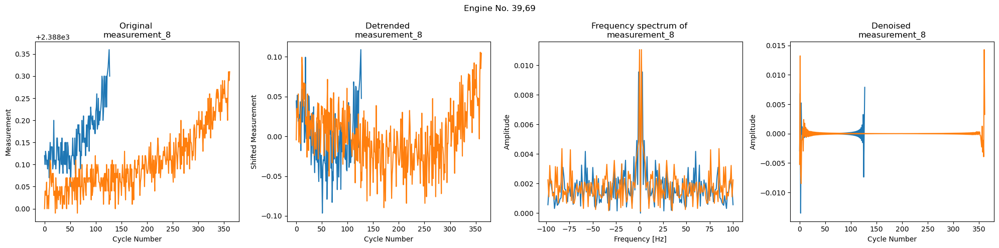

In [21]:
# Making de-noised signal plots for the shortest (39) and longest (69) lived engines 
denoise_engine_signal_one_var("39,69", df, "sensor_measurement_8", start_stop_index=[0,2000], denoising_method="fourier_lowpass", verbose=True)

Denoising method chosen: fourier_highpass


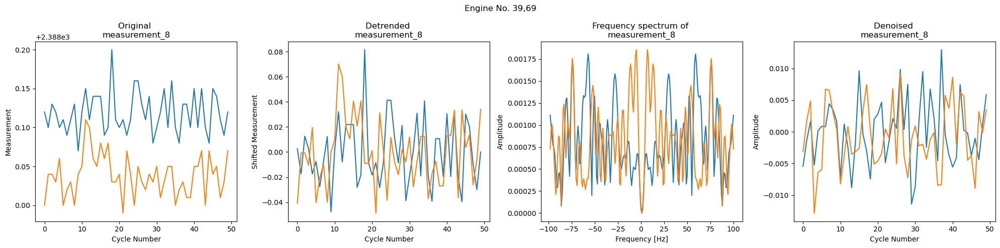

In [16]:
denoise_engine_signal_one_var("39,69", df, "sensor_measurement_8", start_stop_index=[0,50], denoising_method="fourier_highpass",verbose=True)

Denoising method chosen: fourier_magnitude


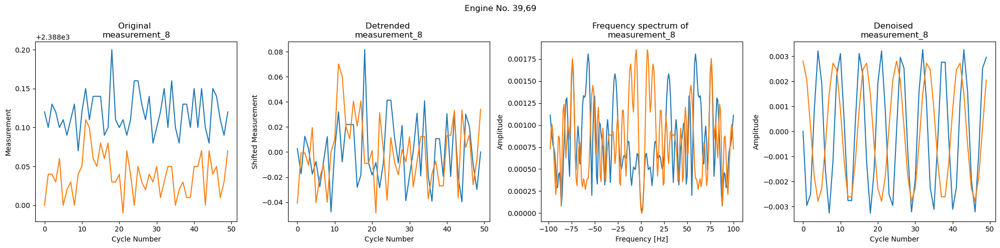

In [17]:
denoise_engine_signal_one_var("39,69", df, "sensor_measurement_8", start_stop_index=[0,50], denoising_method="fourier_magnitude",verbose=True)

Denoising method chosen: wavelet


/Users/chiral/anaconda3/lib/python3.11/site-packages/pywt/_multilevel.py:43: UserWarning: Level value of 3 is too high: all coefficients will experience boundary effects.
  warnings.warn(


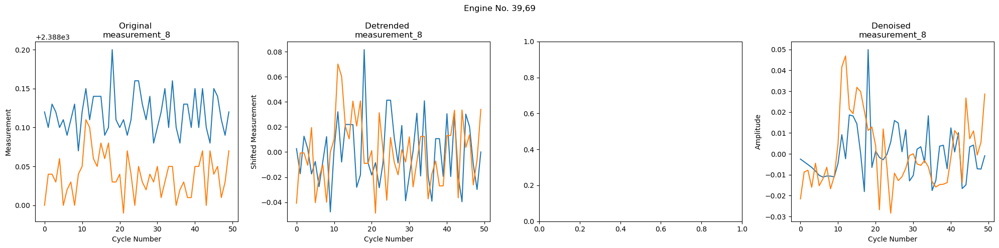

In [18]:
denoise_engine_signal_one_var("39,69", df, "sensor_measurement_8", start_stop_index=[0,50], denoising_method="wavelet", verbose=True)

# De-noising method assestment

Based on the denoising of measurement 8 alone, it seems like the *fourier magnitude* and the *fourier lowpass* methods are the best looking. Although, these both have tunable parameters like *magnitude threshold*, and *cutoff frequency* to consider, which will be different for each of the signals.. lets ignore this for now..

Lets create plots of the other sensor measurements using both methods on a long lived jet to see if signalures produced are similar (The should be) Jet engines *25 and 69* have been identified as long-lived

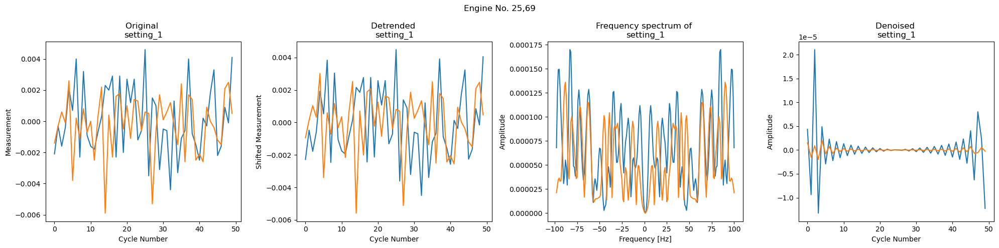

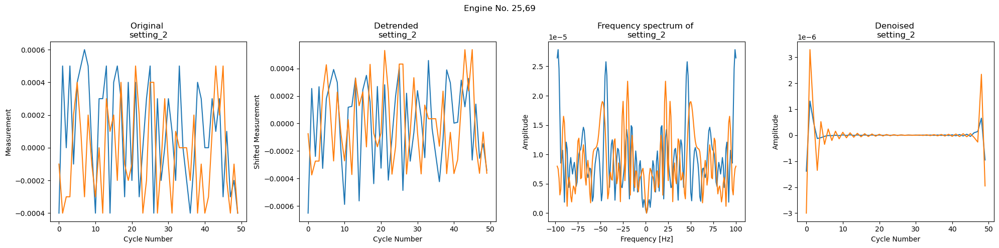

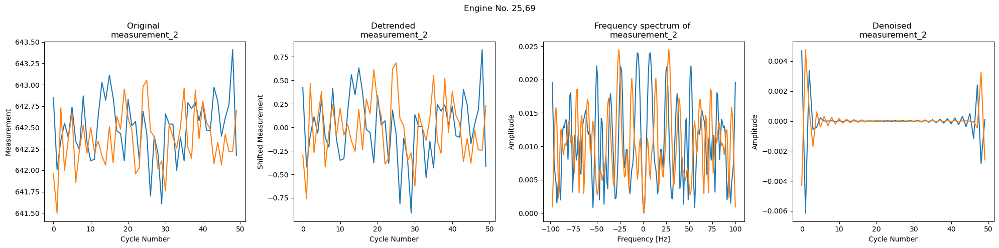

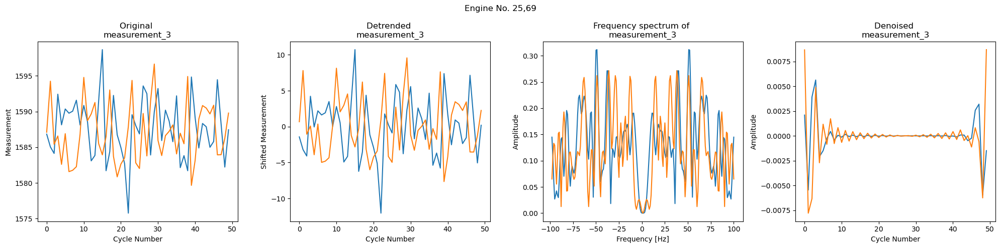

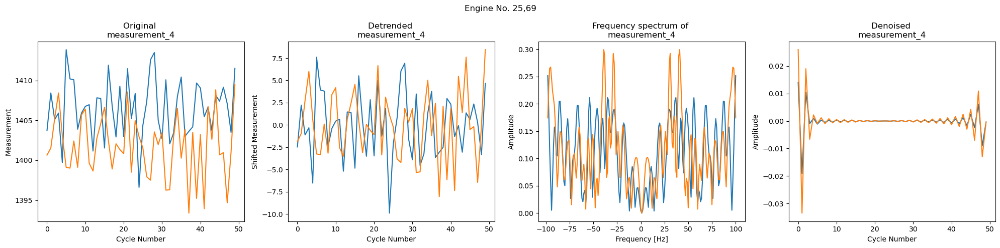

...

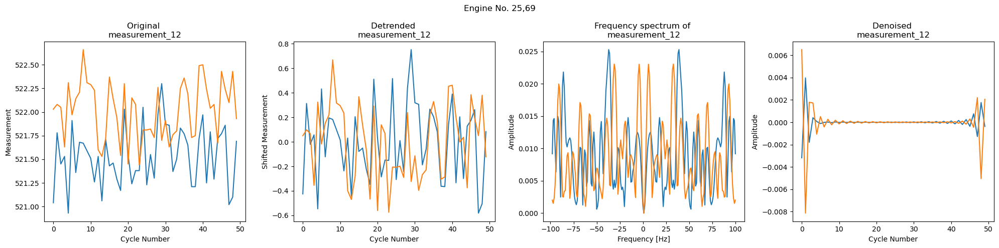

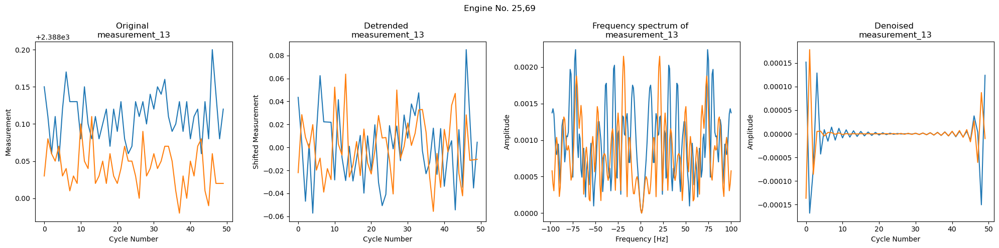

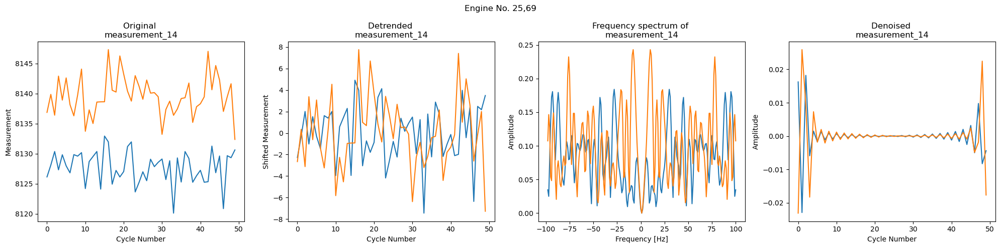

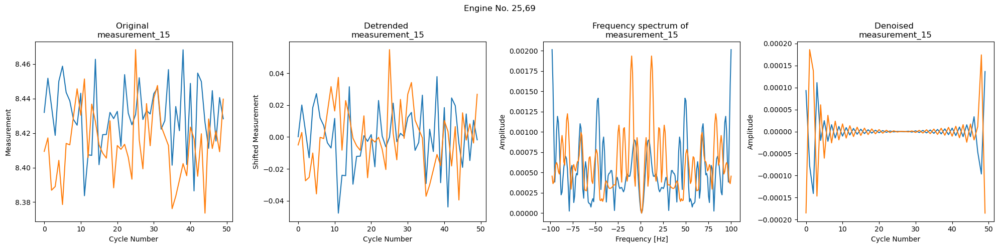

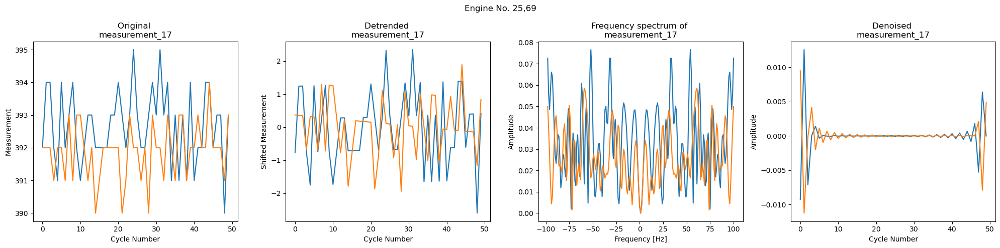

In [19]:
# Let's compare 2 engines that are known to be long-lived using the foutier lowpass method inspired by TagUp
for var in list(df.columns)[2:-2]:
    # print(var)
    denoise_engine_signal_one_var("25,69", df, var, start_stop_index=[0,50], denoising_method="fourier_lowpass")

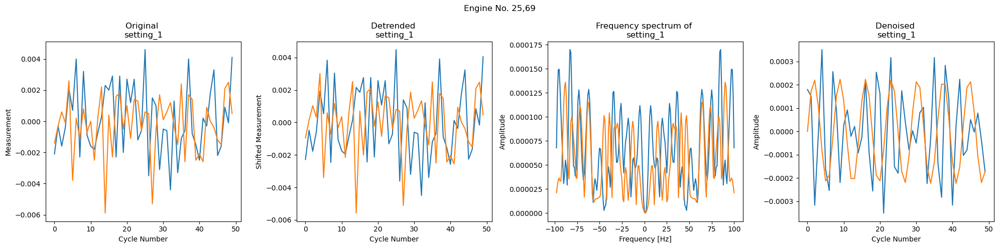

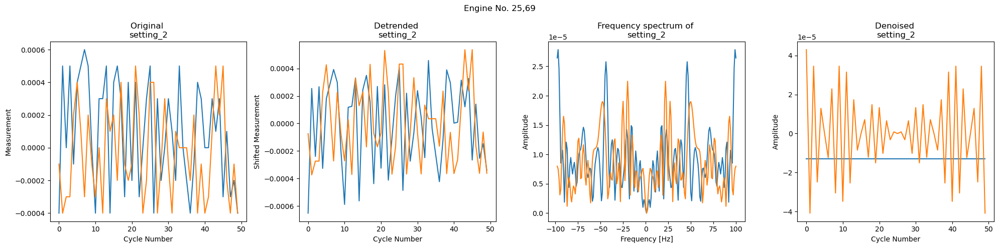

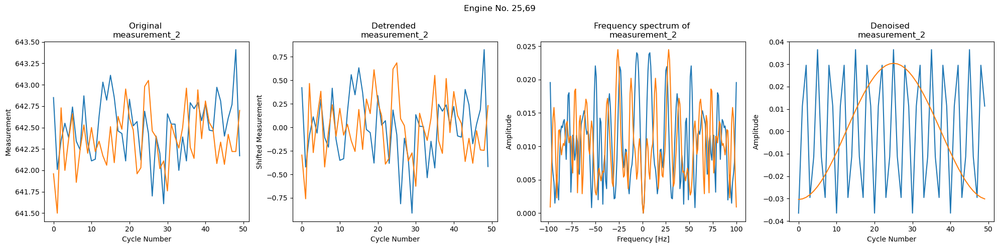

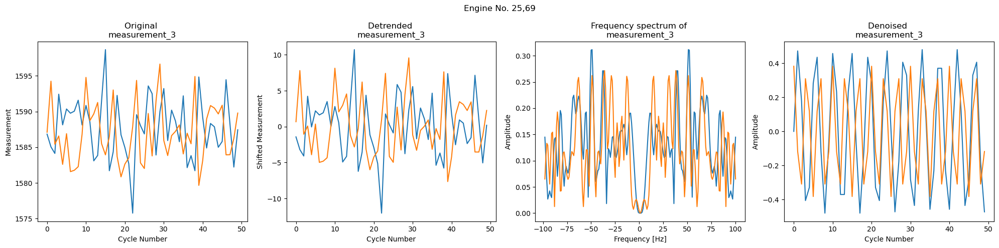

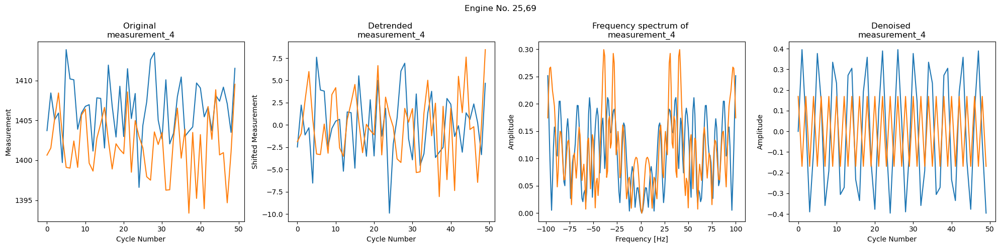

...

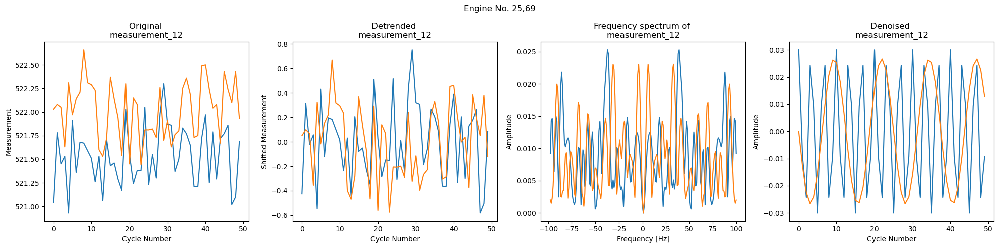

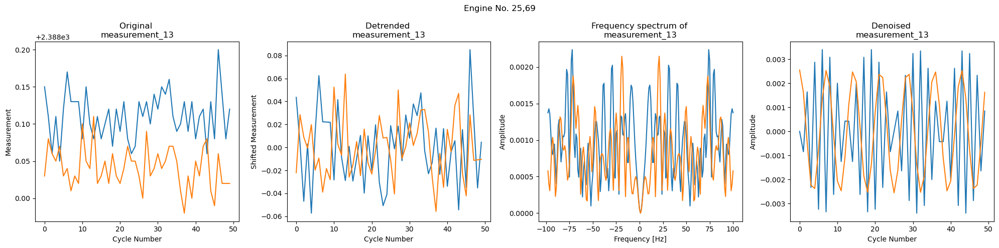

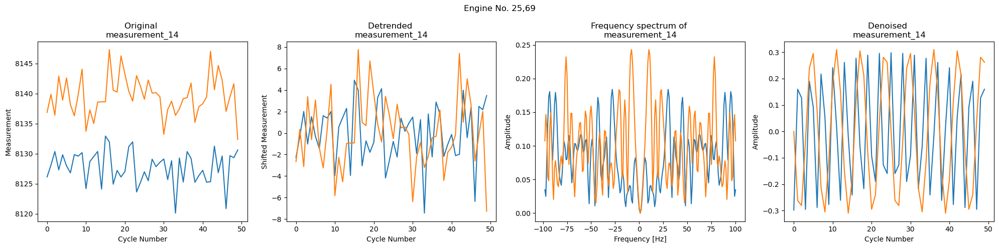

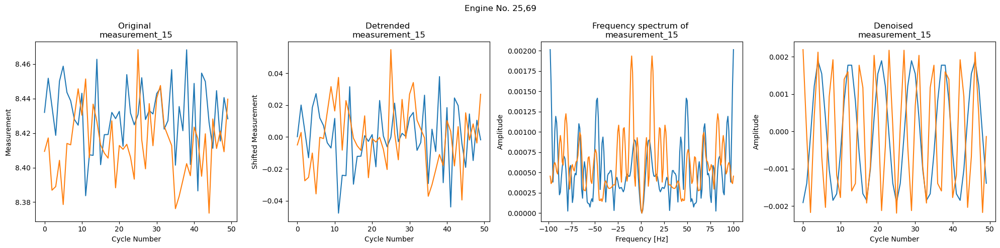

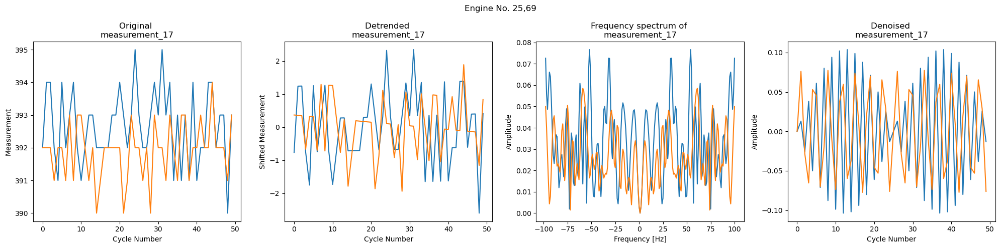

In [20]:
# Let's compare 2 engines that are known to be long-lived using the fourier magnitude method
for var in list(df.columns)[2:-2]:
    # print(var)
    denoise_engine_signal_one_var("25,69", df, var, start_stop_index=[0,50], denoising_method="fourier_magnitude")

# Selecting the denoising method

When assessing the de-noinsing, and based on the similarity of signaure btween two long lived engines that should show similar signaures though a measurement period since they both run for quite a while. The denoising fourier lowpass method used by TagUp seems to denoise the signal best. Lets try and tune the functions to allow for a better de-noinsing, but for now select *fourier lowpass*

/var/folders/qj/3zmdfhnn4bxgc68lbfycnlt40000gn/T/ipykernel_2981/3049250747.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(1, 4, figsize=(20, 5))


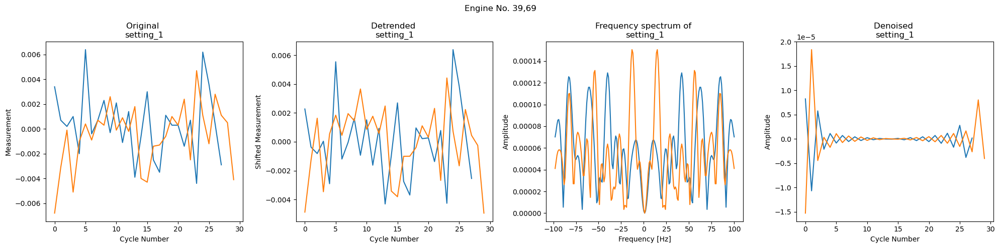

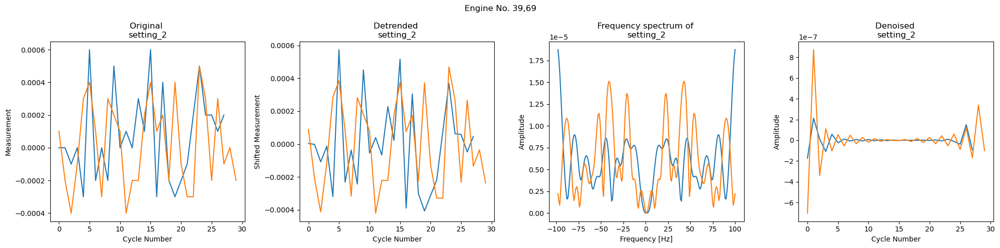

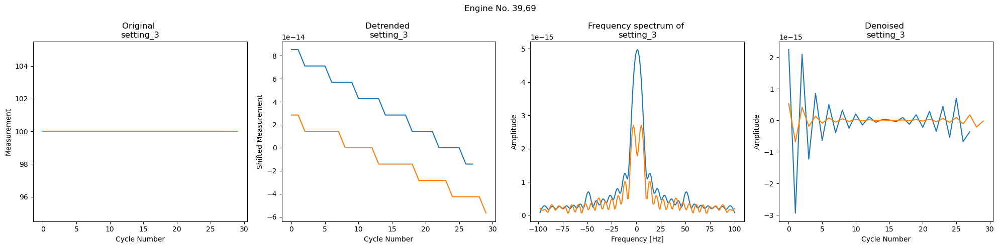

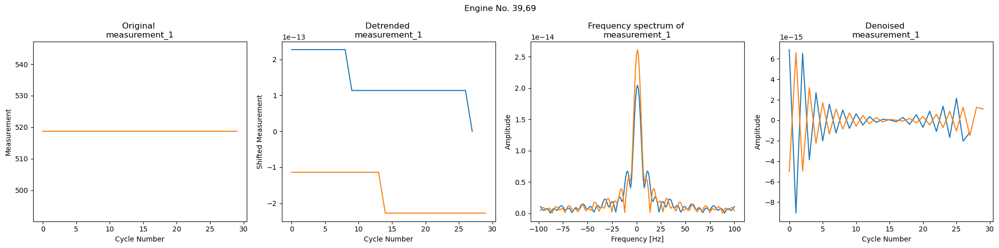

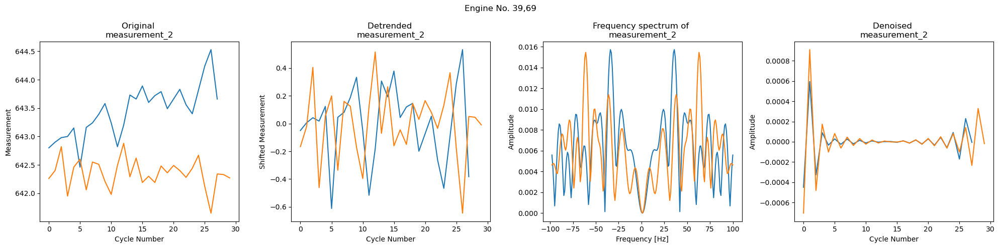

...

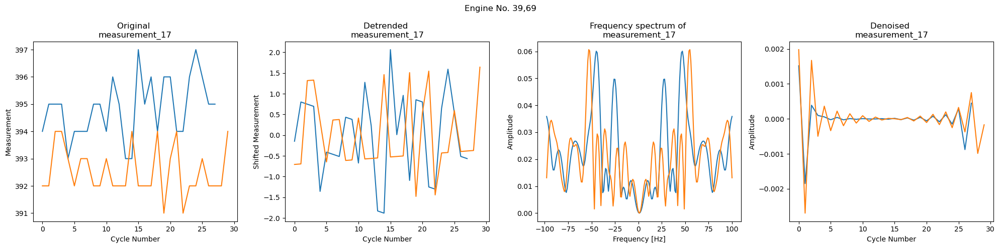

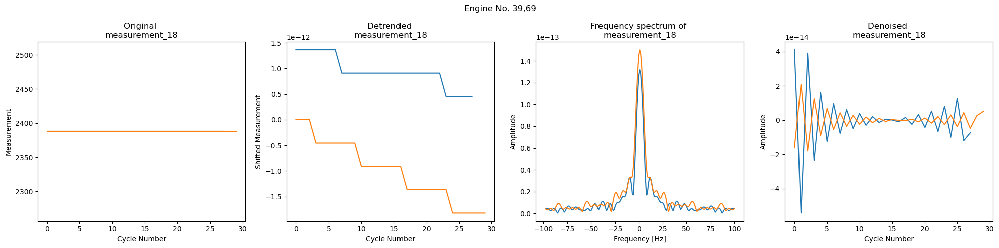

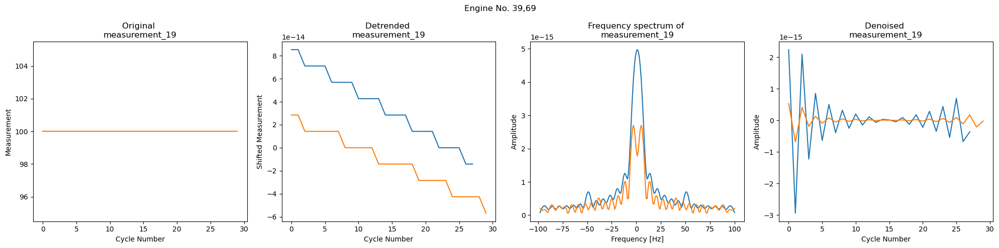

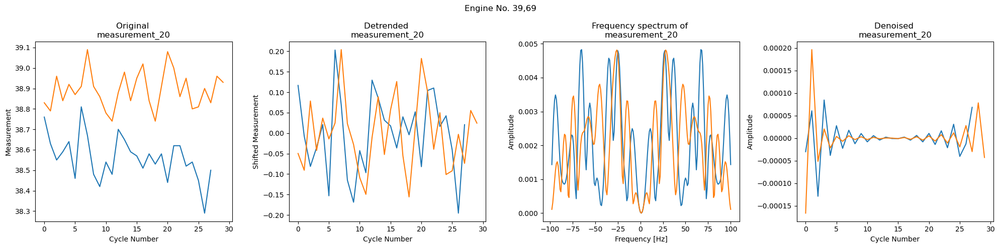

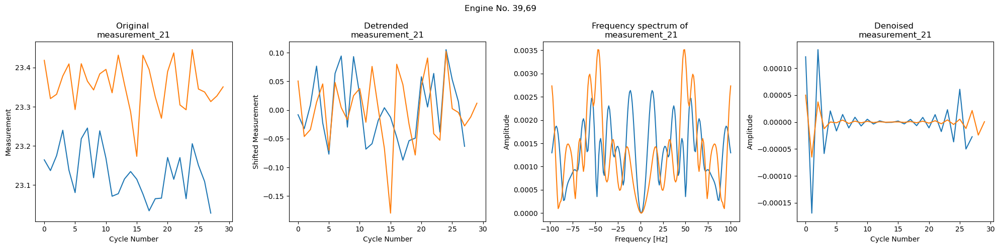

In [112]:
# Let's compare the denoised plots of the longest and shorted lived engines
for var in list(df.columns)[2:-2]:
    # print(var)
    denoise_engine_signal_one_var("39,69", df, var, start_stop_index=[100,130])

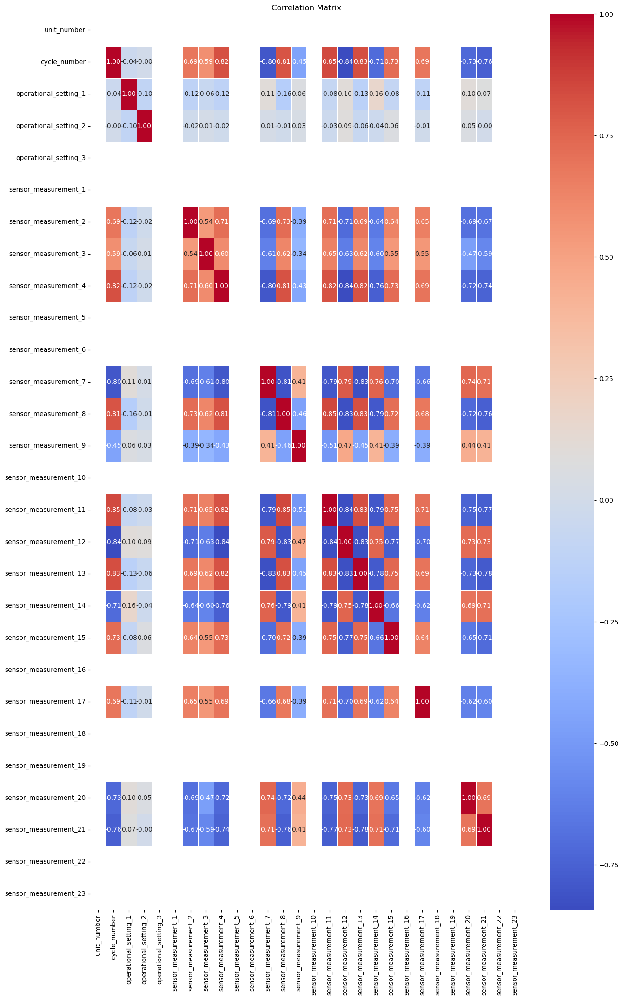

In [116]:
# Compute correlation matrix
corr_matrix = df[df["unit_number"]==1].corr()

# Plot heatmap
plt.figure(figsize=(15, 25))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix")
plt.show()

In [ ]:
# WORK IN PROGRESS
def denoise_engine_signal(engine_num, dataframe):

    
    # There are 26 sensors, 24 with meaningful data so let's make a 5 by 5 grid, the last 2 are NAN plots anyway
    fig, axes = plt.subplots(5, 5, figsize=(35, 35))
    fig.suptitle("Engine No. {}".format(engine_num))

    # Will attempt to denoise the signal plots using a Fourier decomposition (Inspired by the TagUp submission)
    fs = len(dataframe[dataframe["unit_number"]==engine_num]["cycle_number"].values)
    # fs = 200 # 200 Hertz
    nyq_f = fs / 2  # Nyquist frequency [Hz]


    counter=0
    for var, ax in zip(list(dataframe.columns)[2:-2], axes.flat):

        
        signal = dataframe[dataframe["unit_number"]==engine_num][var].values

        # Taking the magnitude of the components and scaling by frequency
        fft_signal = np.abs(fft(signal, fs)) / fs

        if counter==0:
            # print(fft(signal, fs))
        #     print(np.abs(fft(signal, fs)))
            print(np.abs(fft(signal, fs))/fs)
            counter+=1
            
        
        # Extract spectral components
        dc_component = fft_signal[0]
        print(dc_component)
        positive_spectrum = fft_signal[1:int(nyq_f)]
        negative_spectrum = fft_signal[int(nyq_f) + 1:]
        
        # Summing the amplitudes of the frequencies,
        spectrum = np.hstack((negative_spectrum, dc_component, positive_spectrum))
    
        
        # Frequency axis
        frequencies = np.arange(0, len(spectrum)) - len(spectrum) // 2 + 1
    
        # Establishing plot labels and plotting
        plt.title(var)
        ax.set_title("Signal " + var)
        ax.set_xlabel("Frequency [Hz]")
        ax.set_ylabel("Amplitude")
        ax.plot(frequencies,spectrum)

        
    plt.tight_layout()

In [ ]:
denoise_engine_signal(69, df)

In [ ]:
# There are 26 sensors, 24 with meaningful data so let's make a 5 by 5 grid, the last 2 are NAN plots anyway
fig, axes = plt.subplots(5, 5, figsize=(35, 35))
# fig.suptitle("Longest vs Shortest living engine")
for var, ax in zip(list(fft_df.columns)[2:], axes.flat):
    # print(var)
    sns.lineplot(data = fft_df , x = "cycle_number", y = var, 
                 # palette="colorblind",
                 ax=ax
                )
    sns.lineplot(data = fft_df_69 , x = "cycle_number", y = var, 
                 # palette="colorblind",
                 ax=ax
                )
    plt.title(var)

In [ ]:
# Let's take a look at the sensor data for units 69 and 39 which are the longest and shortest living units

# There are 26 sensors, 24 with meaningful data so let's make a 5 by 5 grid, the last 2 are NAN plots anyway
fig, axes = plt.subplots(5, 5, figsize=(35, 35))
# fig.suptitle("Longest vs Shortest living engine")
for var, ax in zip(list(fft_df.columns)[2:], axes.flat):
    # print(var)
    sns.lineplot(data = long_short_living_units , x = "cycle_number", y = var, hue=long_short_living_units["unit_number"], 
                 palette="colorblind",
                 ax=ax
                )
    plt.title(var)

In [8]:
# Let's take a look at the data, we know we have the same characteristics for multiple engines, so let's make a FacetGrid in seaborn
# Let's chunk the plots in groups of 5 
# increment = 5
# for index, section in enumerate(np.arange(5,105,increment)):
#     print(section)
#     g = sns.FacetGrid(df[(df["unit_number"]>(section-increment)) & (df["unit_number"]<=section)], col="unit_number",sharex=True)
#     g.map(sns.lineplot, "cycle_number", "operational_setting_1")
#     # g.map(sns.lineplot, "cycle_number", "sensor_measurement_20")
#     plt.show()
    
# Unit 39 dies the earliest, why?
# Units 67 and 96 are very long-lasting, why?